## Description
Images are everywhere! We live in a time where images contain lots of information, which is sometimes difficult to obtain. This is why image pre-processing has become a highly valuable skill, applicable in many use cases. In this course, you will learn to process, transform, and manipulate images at your will, even when they come in thousands. You will also learn to restore damaged images, perform noise reduction, smart-resize images, count the number of dots on a dice, apply facial detection, and much more, using scikit-image. After completing this course, you will be able to apply your knowledge to different domains such as machine learning and artificial intelligence, machine and robotic vision, space and medical image analysis, retailing, and many more. Take the step and dive into the wonderful world that is computer vision!

---
## 1.Introducing Image Processing and scikit-image
Jump into digital image structures and learn to process them! Extract data, transform and analyze images using NumPy and Scikit-image. With just a few lines of code, you will convert RGB images to grayscale, get data from them, obtain histograms containing very useful information, and separate objects from the background!


## 1.1 Make images come alive with scikit-image
Image processing is a method to perform operations on images, in order to:
- enhance them
- extract useful information
- analyze it and make decisions

Image processing is a subset of computer vision

Applications:
- analysis of medical images
- artificial intelligence
- image restoration
- surveillance and many more

Ppurpose of image processing:
- Visualization: observe objects that are not visible
- Image sharpening and restoration: to create a better image
- Image retrieval: to seek for the image of interest
- Measurement of pattern: to measure objects
- Image Recognition: to distinguish objects in an image

Digital image is an array, or a matrix, of square pixels (picture elements) arranged in columns and rows (2-dimensional matrix). These pixels contain information about color and intensity


In [2]:
# Images in scikit-image

from skimage import io,data, color, filters
import numpy as np, matplotlib.pyplot as plt

astronaut=data.astronaut()

The skimage.data module provides a collection of sample images and other data that you can use for testing, demonstration, and educational purposes.
   
- astronaut() – Color image of an astronaut (Eileen Collins).
- binary_blobs() – Synthetic binary image with blobs.
- brain() – MRI scan of a human brain (grayscale).
- brick() – Image of a brick wall (grayscale).
- camera() – Classic grayscale "camera man" image.
- cat() – Color image of a cat.
- cell() – Human cell (grayscale microscopy image).
- checkerboard() – Checkerboard pattern (grayscale).
- chelsea() – Color image of a cat (Chelsea the cat).
- clock() – Image of a clock (grayscale).
- coffee() – Close-up of a cup of coffee.
- coins() – Greek coins (grayscale).
- colorwheel() – RGB color wheel.
- eagle() – Image of an eagle.
- grass() – Image of grass.
- gravel() – Image of gravel.
- horse() – Grayscale image of a horse.
- hubble_deep_field() – Hubble telescope deep field image.
- human_mitosis() – Microscopy image of human cell mitosis.
- immunohistochemistry() – Immunohistochemical staining image.
- kidney() – Histology image of a kidney.
- lfw_subset() – Subset of the Labeled Faces in the Wild dataset.
- lily() – Image of a lily flower.
- logo() – Scikit-image logo.
- microaneurysms() – Fundus image with microaneurysms.
- moon() – Surface of the moon (grayscale).
- page() – Old book page (grayscale).
- protein_transport() – Fluorescence microscopy image.
- retina() – Retina image (color fundus photography).
- rocket() – Image of a rocket launch.
- shepp_logan_phantom() – Synthetic Shepp-Logan phantom (MRI simulation).
- skin() – Histology image of skin tissue.
- stereo_motorcycle() – Stereo pair of a motorcycle scene.
- text() – Image with text (grayscale).
- wheel() – Color image of a wheel.

In [3]:
# Gray images in scikit-image
astronaut.shape, astronaut[0], astronaut[1], astronaut[2]

((512, 512, 3),
 array([[154, 147, 151],
        [109, 103, 124],
        [ 63,  58, 102],
        ...,
        [127, 120, 115],
        [120, 117, 106],
        [125, 119, 110]], dtype=uint8),
 array([[177, 171, 171],
        [144, 141, 143],
        [113, 114, 124],
        ...,
        [127, 118, 112],
        [124, 115, 108],
        [121, 116, 105]], dtype=uint8),
 array([[201, 194, 193],
        [182, 178, 175],
        [168, 165, 164],
        ...,
        [128, 120, 117],
        [126, 116, 112],
        [124, 114, 109]], dtype=uint8))

### RGB vs Grayscale
RGB images have three color channels, while grayscaled ones have a single channel. We can convert an image with RGB channels into grayscale using the function rgb2gray() provided in the color module. We can also turn grayscale to RGB using gray2rgb().

In [4]:
# Turn Colored to Grayed one
astronaut_gray=color.rgb2gray(astronaut)
astronaut_gray.shape, astronaut_gray

((512, 512),
 array([[5.83434902e-01, 4.14859216e-01, 2.44058431e-01, ...,
         4.75007843e-01, 4.58213333e-01, 4.69121961e-01],
        [6.75588235e-01, 5.56006667e-01, 4.49052941e-01, ...,
         4.68548627e-01, 4.56501176e-01, 4.55958431e-01],
        [7.66334902e-01, 7.00524314e-01, 6.49276078e-01, ...,
         4.76406667e-01, 4.62104314e-01, 4.53978431e-01],
        ...,
        [6.81696471e-01, 6.81979216e-01, 6.71889020e-01, ...,
         0.00000000e+00, 2.82745098e-04, 0.00000000e+00],
        [6.74694510e-01, 6.68532941e-01, 6.64030196e-01, ...,
         2.82745098e-04, 3.92156863e-03, 0.00000000e+00],
        [6.70482353e-01, 6.63189804e-01, 6.52838824e-01, ...,
         0.00000000e+00, 3.92156863e-03, 0.00000000e+00]]))

In [5]:
# Turn grayscale to RGB
astronaut_rgb=color.gray2rgb(astronaut_gray)
astronaut_rgb.shape, astronaut_rgb

((512, 512, 3),
 array([[[5.83434902e-01, 5.83434902e-01, 5.83434902e-01],
         [4.14859216e-01, 4.14859216e-01, 4.14859216e-01],
         [2.44058431e-01, 2.44058431e-01, 2.44058431e-01],
         ...,
         [4.75007843e-01, 4.75007843e-01, 4.75007843e-01],
         [4.58213333e-01, 4.58213333e-01, 4.58213333e-01],
         [4.69121961e-01, 4.69121961e-01, 4.69121961e-01]],
 
        [[6.75588235e-01, 6.75588235e-01, 6.75588235e-01],
         [5.56006667e-01, 5.56006667e-01, 5.56006667e-01],
         [4.49052941e-01, 4.49052941e-01, 4.49052941e-01],
         ...,
         [4.68548627e-01, 4.68548627e-01, 4.68548627e-01],
         [4.56501176e-01, 4.56501176e-01, 4.56501176e-01],
         [4.55958431e-01, 4.55958431e-01, 4.55958431e-01]],
 
        [[7.66334902e-01, 7.66334902e-01, 7.66334902e-01],
         [7.00524314e-01, 7.00524314e-01, 7.00524314e-01],
         [6.49276078e-01, 6.49276078e-01, 6.49276078e-01],
         ...,
         [4.76406667e-01, 4.76406667e-01, 4.7640666

## Function show image to display the image using matplotlib

In [6]:
# Function show image to display the image using matplotlib

import matplotlib.pyplot as plt

def show_image(image, title='Image', cmap_type='gray'):
    plt.imshow(image, cmap=cmap_type)
    plt.title(title)
    plt.axis('on')
    plt.show()

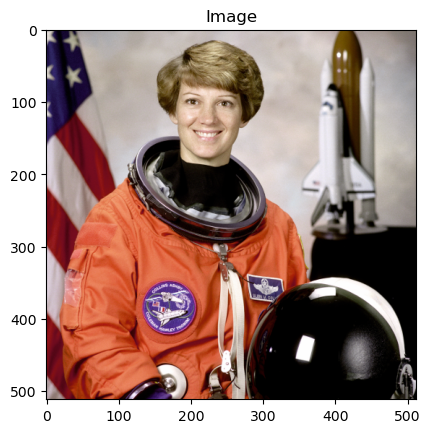

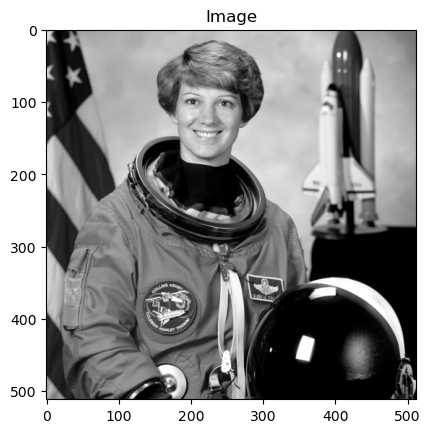

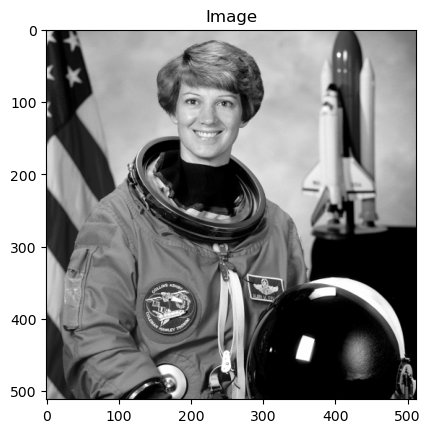

In [7]:
show_image(astronaut)
show_image(astronaut_gray)
show_image(astronaut_rgb)

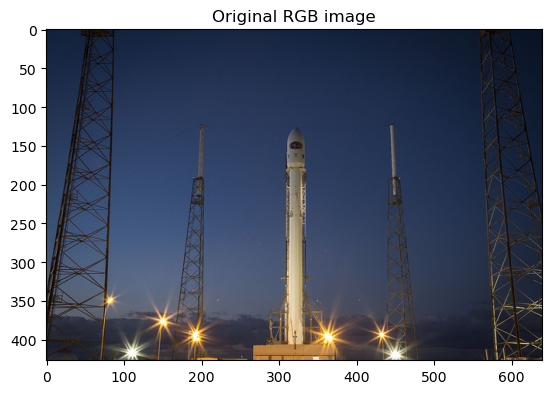

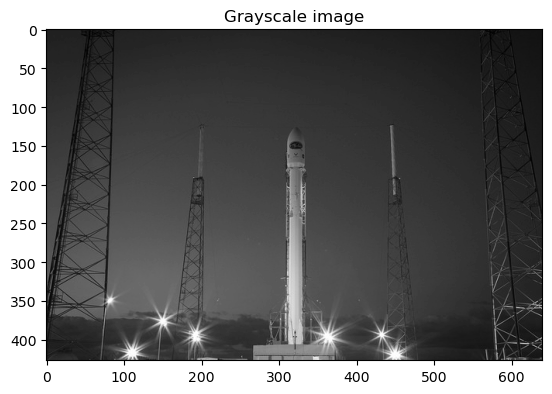

In [8]:
# Complete example
# Import the modules from skimage
from skimage import io, data, color


# Load the rocket image
rocket = data.rocket()

# Convert the image to grayscale
rocket_gray = color.rgb2gray(rocket)

# Show the original image
show_image(rocket, 'Original RGB image')

# Show the grayscale image
show_image(rocket_gray, 'Grayscale image')

## 1.2 NumPy for images
With NumPy, we can practice simple image processing techniques, such as:
- flipping images
- extracting features and analyzing them

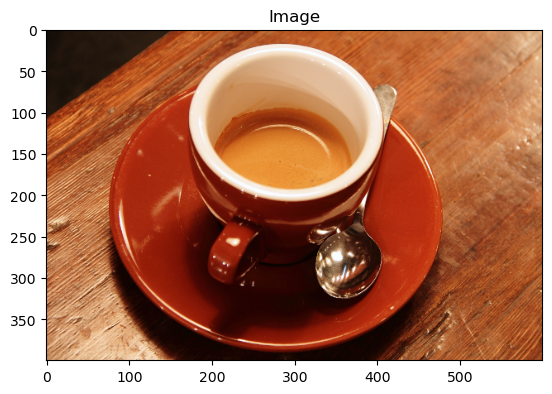

In [9]:
# Download image
coffee=data.coffee()
show_image(coffee)

In [10]:
# Type of image
type(coffee)

# Obtainin the red values of the image
red=coffee[:, :, 0]

# Obtainin the green values of the image
green=coffee[:, :, 1]

# Obtainin the blue values of the image
blue=coffee[:, :, 2]

In [11]:
red, green, blue

(array([[ 21,  21,  20, ..., 228, 231, 228],
        [ 21,  21,  20, ..., 228, 231, 229],
        [ 21,  23,  20, ..., 228, 228, 229],
        ...,
        [189, 214, 197, ..., 165, 161, 143],
        [207, 201, 196, ..., 154, 147, 145],
        [197, 195, 193, ..., 158, 144, 143]], dtype=uint8),
 array([[ 13,  13,  11, ..., 182, 185, 184],
        [ 13,  13,  14, ..., 182, 185, 183],
        [ 14,  13,  14, ..., 182, 184, 185],
        ...,
        [124, 155, 141, ...,  86,  82,  67],
        [148, 142, 140, ...,  74,  66,  65],
        [141, 137, 138, ...,  73,  64,  60]], dtype=uint8),
 array([[  8,   9,   8, ..., 138, 142, 140],
        [  7,   9,   7, ..., 136, 139, 137],
        [  7,  10,   9, ..., 136, 137, 138],
        ...,
        [ 77, 109, 100, ...,  37,  41,  29],
        [102,  99,  97, ...,  37,  33,  31],
        [100,  99,  98, ...,  38,  30,  29]], dtype=uint8))

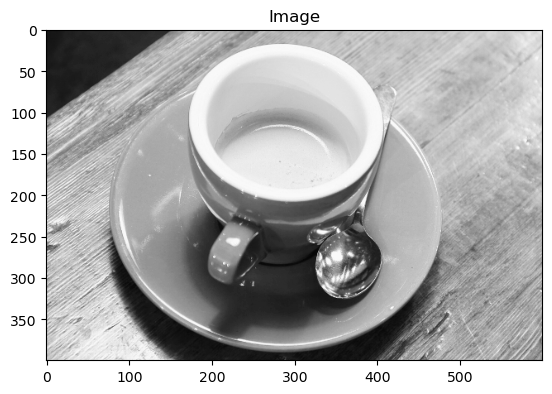

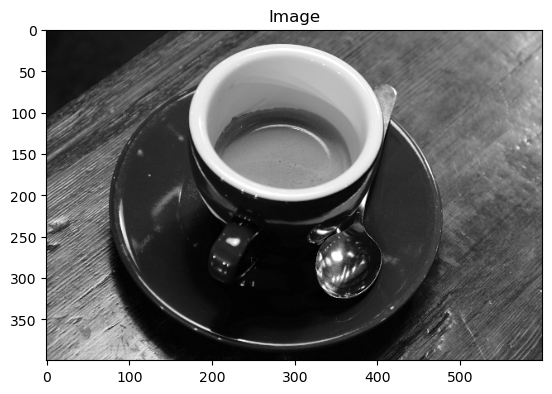

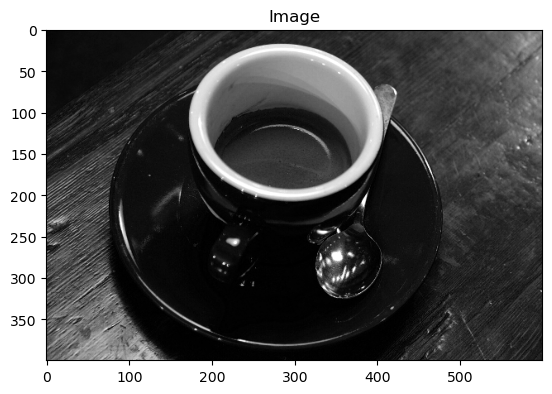

In [12]:
# Show the image with cmap_type='gray'
show_image(red)
show_image(green)
show_image(blue)

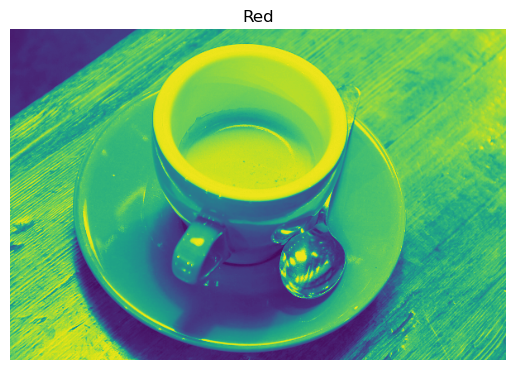

In [13]:
# Colors with NumPy

plt.imshow(red)
plt.title('Red')
plt.axis("off")
plt.show()

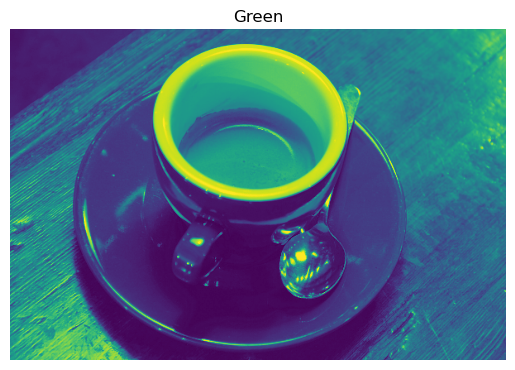

In [14]:
plt.imshow(green,)
plt.title('Green')
plt.axis("off")
plt.show()

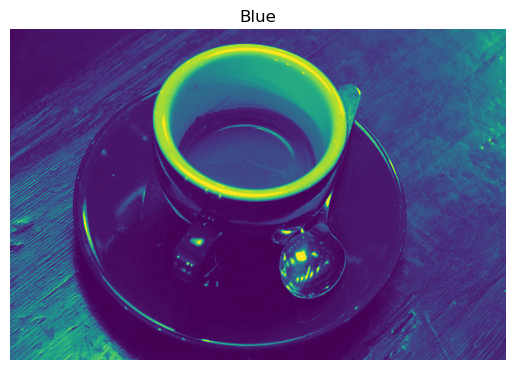

In [15]:
plt.imshow(blue, )
plt.title('Blue')
plt.axis("off")
plt.show()

In [16]:
# Shape of the image, size of image

coffee.shape, coffee.size

((400, 600, 3), 720000)

### We can flip the image vertically by using the flipud() method (up-down)

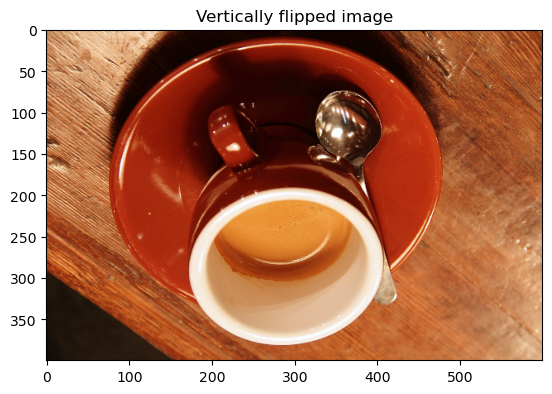

In [17]:
# Flip the image in up direction

vertically_flipped=np.flipud(coffee)
show_image(vertically_flipped, 'Vertically flipped image')

### We can flip the image horizontally by using the fliplr() method (left-right)

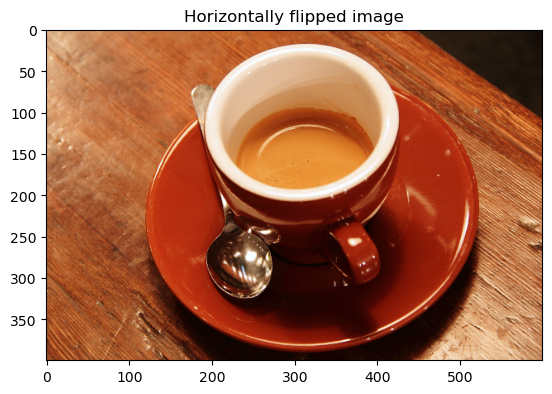

In [18]:
# Flip the image in horizontally

horizontally_flipped=np.fliplr(coffee)
show_image(horizontally_flipped, 'Horizontally flipped image')

### The histogram of an image is a graphical representation of the amount of pixels of each intensity value. From 0 (pure black) to 255(pure white)

- Application of histogram:
    - Analysis
    - Thresholding
    - Brightness and contrast
    - equalize an image
  
#### Histograms in Matplotlib

Matplotlib has a histogram method. It takes an input array (frequency) and bins as parameters. The successive elements in bin array act as the boundary of each bin. We obtain the red color channel of the image by slicing it. We then use the histogram function. Use ravel to return a continuous flattened array from the color values of the image, in this case red. And pass this ravel and the bins as parameters. We set bins to 256 because we'll show the number of pixels for every pixel value, that is, from 0 to 255. Meaning you need 256 values to show the histogram.

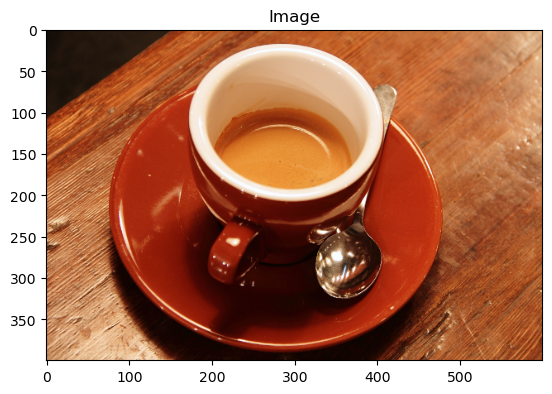

In [19]:
show_image(coffee)

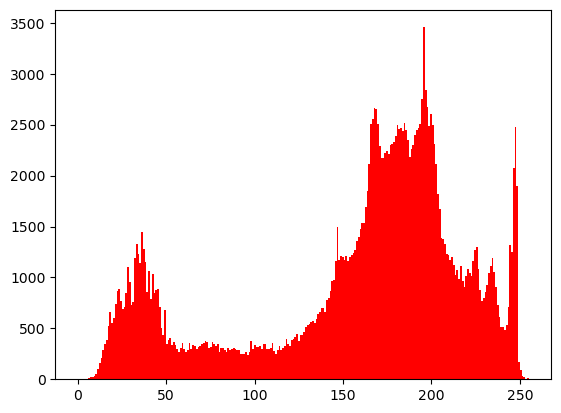

In [20]:
# Red color of the image
red=coffee[:, :, 0]

# Obtain the red histogram
plt.hist(red.ravel(), bins=256, color='red')
plt.show()

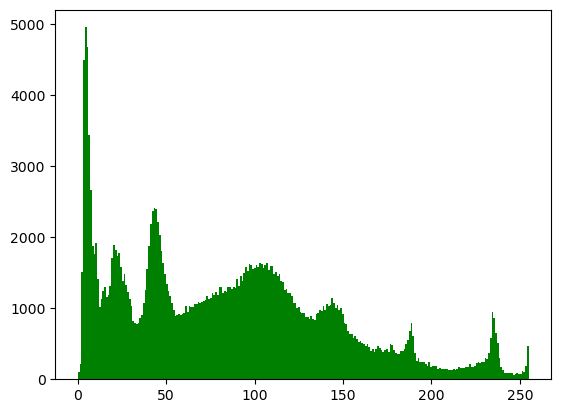

In [21]:
# Blue color of the image
green=coffee[:, :, 1]

# Obtain the blue histogram
plt.hist(green.ravel(), bins=256, color='green')
plt.show()

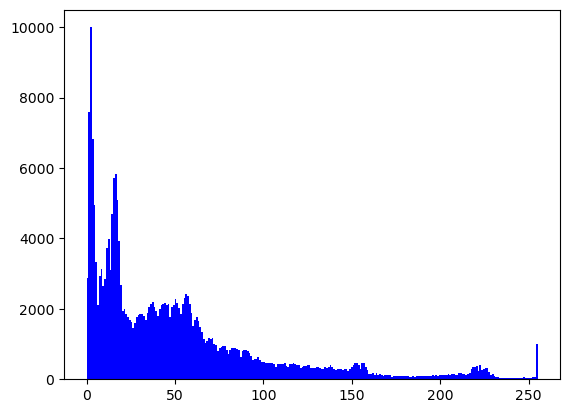

In [22]:
# Blue color of the image
blue=coffee[:, :, 2]

# Obtain the blue histogram
plt.hist(blue.ravel(), bins=256, color='blue')
plt.show()

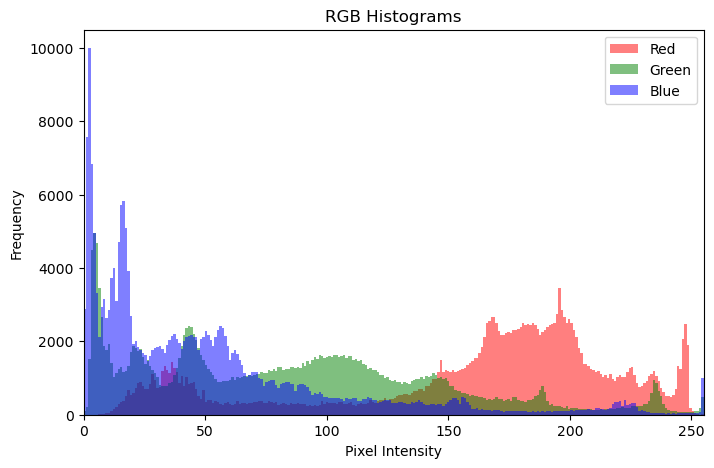

In [23]:
# Method 2: Overlaying All Histograms in One Plot

plt.figure(figsize=(8, 5))
plt.hist(red.ravel(), bins=256, color='red', alpha=0.5, label='Red')
plt.hist(green.ravel(), bins=256, color='green', alpha=0.5, label='Green')
plt.hist(blue.ravel(), bins=256, color='blue', alpha=0.5, label='Blue')
plt.title('RGB Histograms')
plt.xlabel('Pixel Intensity')
plt.ylabel('Frequency')
plt.legend()
plt.xlim(0, 255)
plt.show()

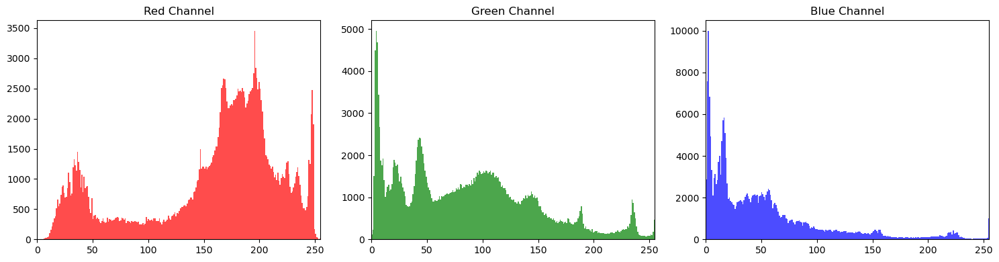

In [24]:
# Method 1: Using plt.subplots()

# Create a figure with 3 subplots (1 row, 3 columns)
fig, axes = plt.subplots(1, 3, figsize=(15, 4))

# Plot histograms
axes[0].hist(red.ravel(), bins=256, color='red', alpha=0.7)
axes[0].set_title('Red Channel')
axes[0].set_xlim(0, 255)

axes[1].hist(green.ravel(), bins=256, color='green', alpha=0.7)
axes[1].set_title('Green Channel')
axes[1].set_xlim(0, 255)

axes[2].hist(blue.ravel(), bins=256, color='blue', alpha=0.7)
axes[2].set_title('Blue Channel')
axes[2].set_xlim(0, 255)

plt.tight_layout()  # Adjust spacing
plt.show()

## 1.3 Thresholding
Thresholding is the simplest method of image segmentation, and is used to partition the background and foreground of grayscale images, by essentially making them black and white. We compare each pixel to a given threshold value. If the pixel is less than that value, we turn it white. If it's greater; we turn it black

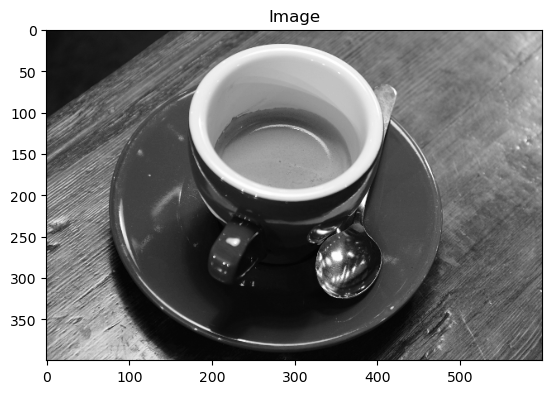

In [25]:
# Transform it to gray
coffee_gray = color.rgb2gray(coffee)
show_image(coffee_gray)

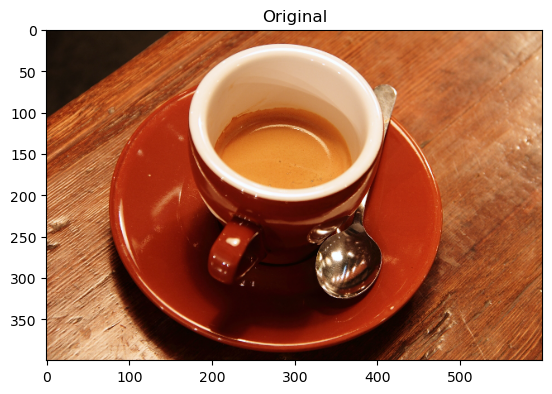

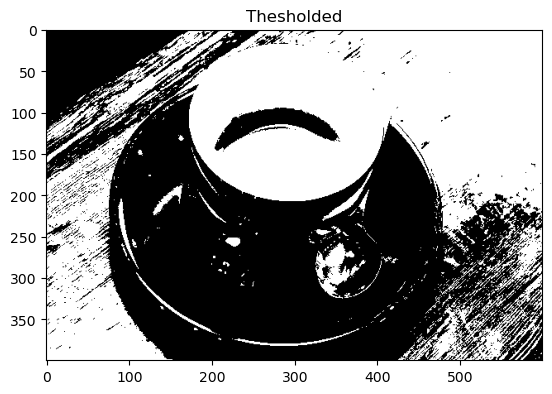

In [26]:
# Aply the threshloding

# Obtain the optimal threshold value using Otsu's method
thresh = filters.threshold_otsu(coffee_gray)

# Apply thresholding to the image
binary=coffee_gray > thresh

# Show the original, grayscale, and thresholded images
show_image(coffee, "Original")
show_image(binary, "Thesholded")

We can also apply inverted thresholding, which is just inverting the color. We apply it just as we do in thresholding, except we use "<=" operator instead of ">". Here the resulting image is also binary but the background is black and foreground white.

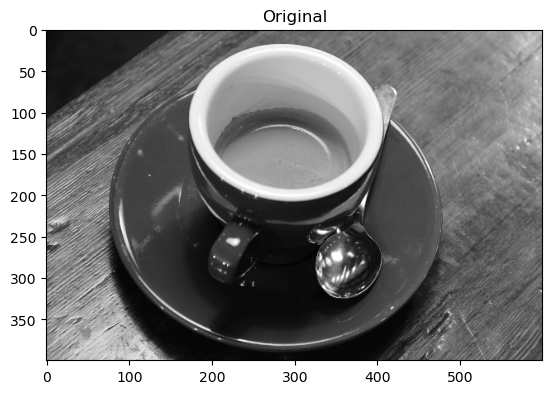

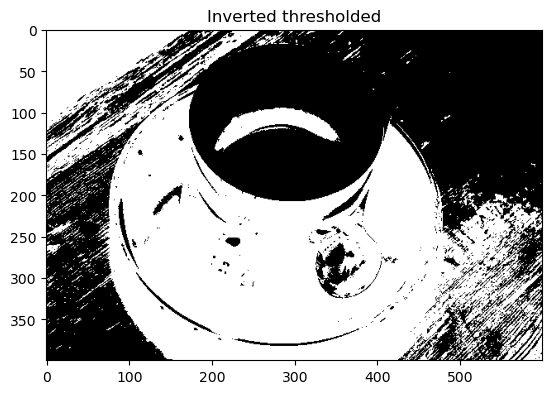

In [27]:
# Obtain the optimal threshold value using Otsu's method
thresh = filters.threshold_otsu(coffee_gray)

# Apply thresholding to the image
inverted_binary=coffee_gray <= thresh

# Show the original, grayscale, and thresholded images
show_image(coffee_gray, "Original")
show_image(inverted_binary, "Inverted thresholded")

## Categories of thresholding
- Global or histogram based: good for uniform background
- Local or adaptive: for uneven backgound illumination

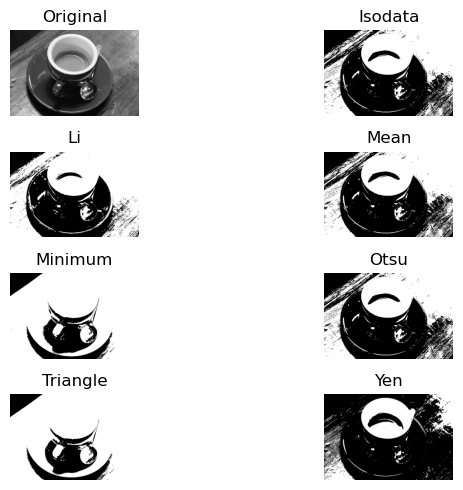

In [28]:
from skimage.filters import try_all_threshold

# Obtain all the resulting images
fig, ax=try_all_threshold(coffee_gray, verbose=False)

# Showin resulting plots
plt.show(fig, ax)

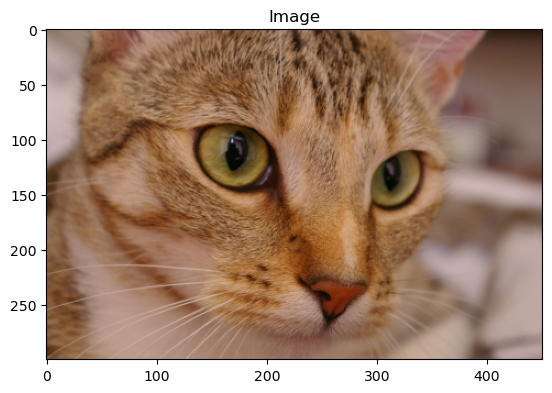

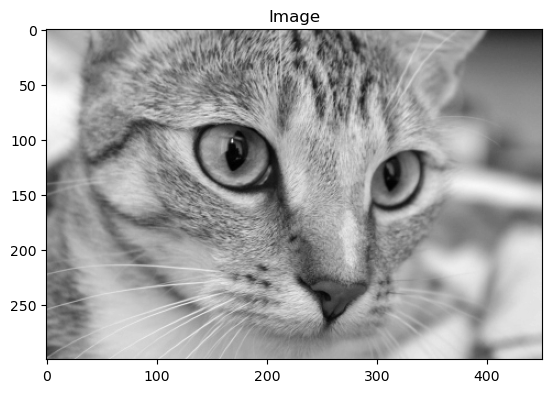

In [29]:
chelsea=data.chelsea()
show_image(chelsea)
chelsea_gray=color.rgb2gray(chelsea)
show_image(chelsea_gray)

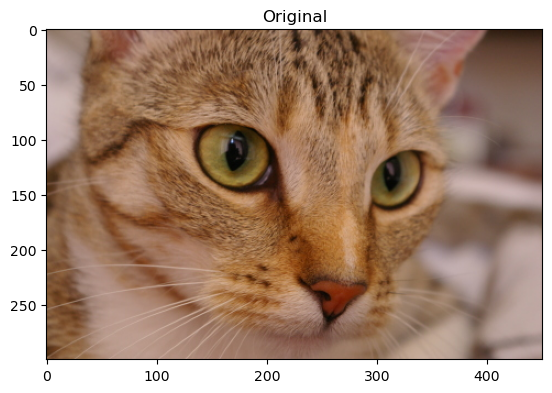

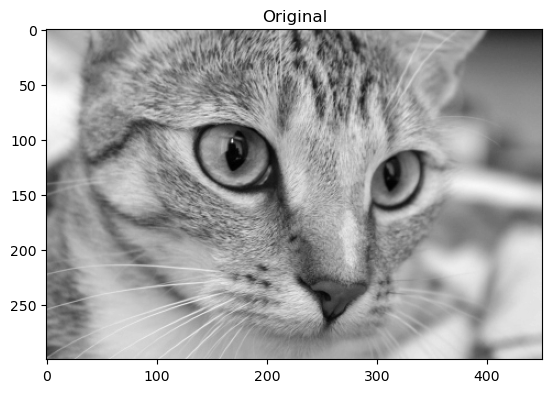

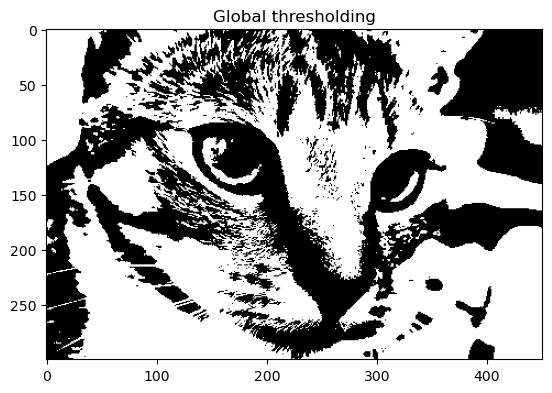

In [30]:
# Glopal uniform background
from skimage.filters import threshold_otsu

# Obtain the optimal threshold value
thresh=threshold_otsu(chelsea_gray)

# Apply thresholding to the image
binary_global= chelsea_gray>thresh

# Show the original and bianarized image
show_image(chelsea, "Original")
show_image(chelsea_gray, "Original")
show_image(binary_global, 'Global thresholding')

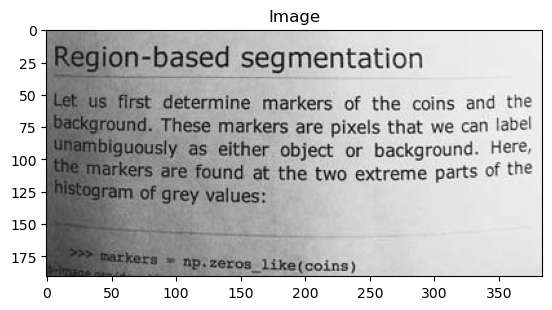

In [31]:
# Local uneven backgound

page=data.page()
show_image(page)

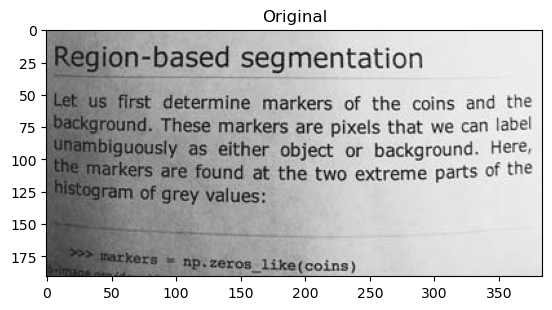

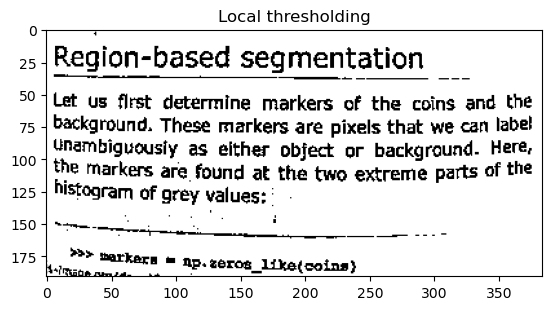

In [32]:
# Import the local threshol function
from skimage.filters import threshold_local

# Set the block size to 35
block_size=35

# Obtain the optimal local thresholding
local_thresh=threshold_local(page, block_size, offset=10)

# Apply local thresholding and obtain the binary image
binary_local=page>local_thresh

# show the original and binarized image
show_image(page, "Original")
show_image(binary_local, "Local thresholding")

---
## 2.1 Filtering
Filtering is a technique for modifying or enhancing an image. In essence, a filter is a mathematical function that is applied to images. It can be used to emphasize or remove certain features, like edges. Smoothing, sharpening and edge detection.

### Neighborhoods
Certain image processing operations involve processing an image in sections, called blocks or neighborhoods, rather than processing the entire image at once. This is the case for filtering, histogram equalization for contrast enhancement, and morphological functions, all three of which use this approach.

### 2.1.1 Edge detection¶
With filtering we can detect edges. This technique can be used to find the boundaries of objects within images. As well as segment and extract information like how many coins are in an image. Most of the shape information of an image is enclosed in edges.

Edge detection works by detecting discontinuities in brightness.

A common edge detection algorithm is Sobel. This is a filter that we can find in scikit image's module filters with the sobel function.

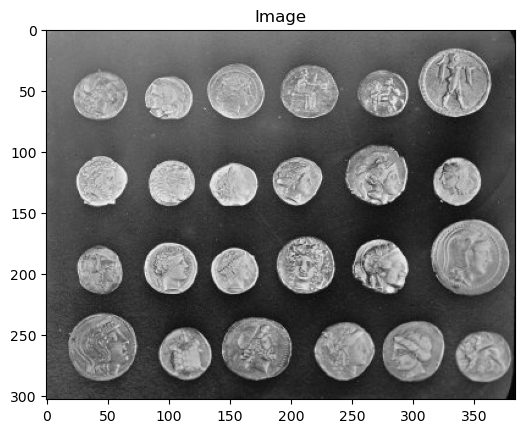

In [33]:
# Down load the impage (already in gray scale)
coins=data.coins()
show_image(coins)

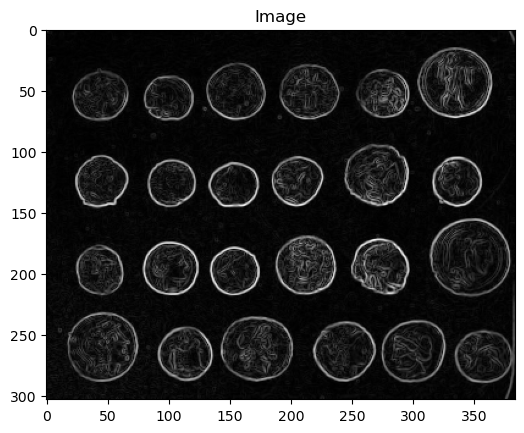

In [34]:
# Import module and function
from skimage.filters import sobel

# Apply edge detection filter
edge_sobel=sobel(coins)
show_image(edge_sobel)

In [35]:
# As function
def plot_comparison(original, filtered, title_filtered):
    fig, (ax1, ax2)=plt.subplots(ncols=2, figsize=(8,6), sharex=True, sharey=True)
    
    ax1.imshow(original, cmap=plt.cm.gray)
    ax1.set_title("Original")
    ax1.axis("off")
    
    ax2.imshow(filtered, cmap=plt.cm.gray)
    ax2.set_title(title_filtered)
    ax2.axis("off")

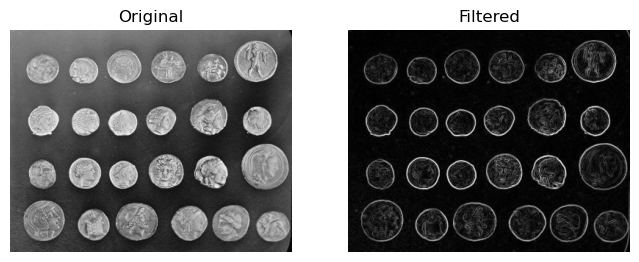

In [36]:
plot_comparison(coins, edge_sobel, "Filtered")

### 2.1.2 Smoothing
Gaussian smoothing is another filtering technique. We can achieve this with a Gaussian filter. This technique is typically used to blur an image or to reduce noise.

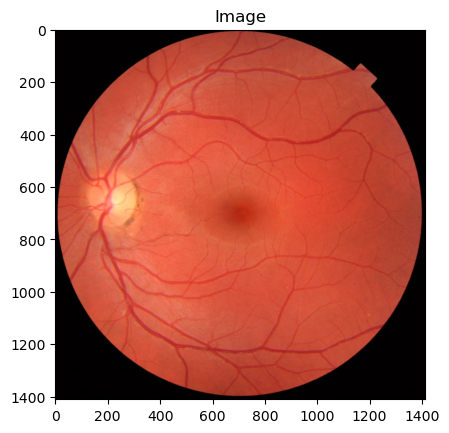

In [37]:
retina=data.retina()
show_image(retina)

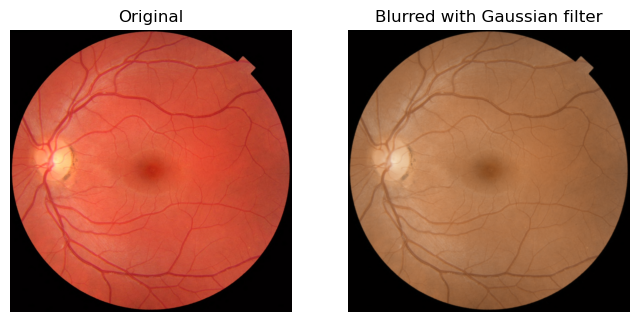

In [38]:
# Import the module and function
from skimage.filters import gaussian

# Apply edge detection filter
retina_gaussian=gaussian(retina)

# Show original and resulting image to compare
plot_comparison(retina, retina_gaussian, "Blurred with Gaussian filter")

### 2.2 Contrast enhancement
The contrast of an image can be understood as a measure of its dynamic range—the difference between the brightest and darkest pixels. This is often reflected in the 'spread' of its histogram. In other words, high contrast means a wide distribution of intensities (from very dark to very bright), while low contrast means pixel values are clustered in a narrow range.

To inhance contrast we use:
- Contrast stretching
- Histogram equalization

Type of histogram equalization:
- Histogram equalization
- Adaptive histogram equalization
- Contrast Limited Adaptie Histogram Equalization(CLAHE)

In [39]:
moon=data.moon()

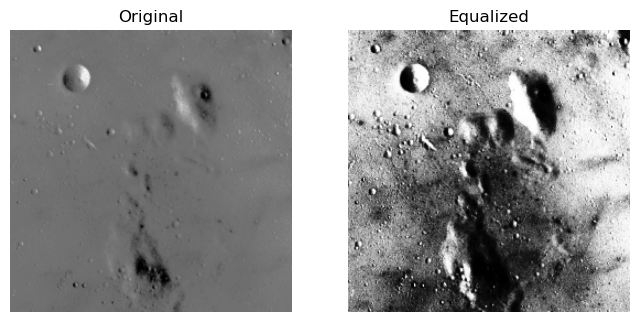

In [40]:
# Histogram equalization

from skimage import exposure

# Obtain the equalized image
moon_eq=exposure.equalize_hist(moon)

# Show 
plot_comparison(moon, moon_eq, "Equalized")

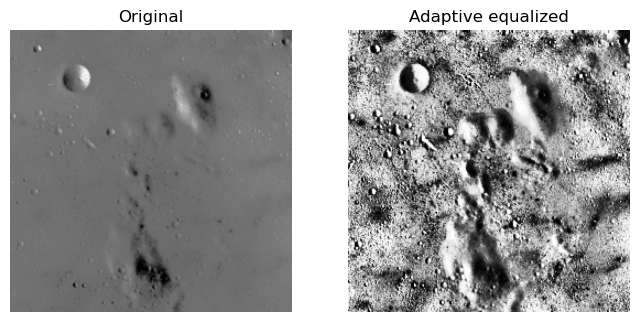

In [41]:
# CLAHE equalization

# Apply adaptive equalization
moon_adapteq=exposure.equalize_adapthist(moon, clip_limit=0.3)

# Show the result
plot_comparison(moon, moon_adapteq, "Adaptive equalized")

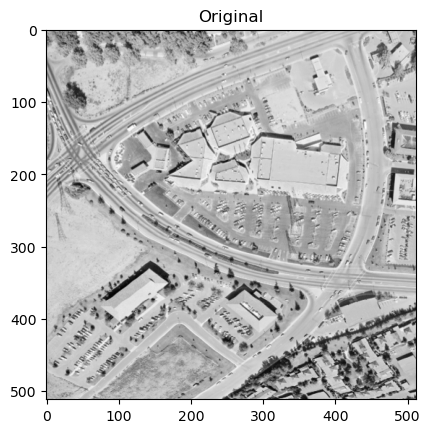

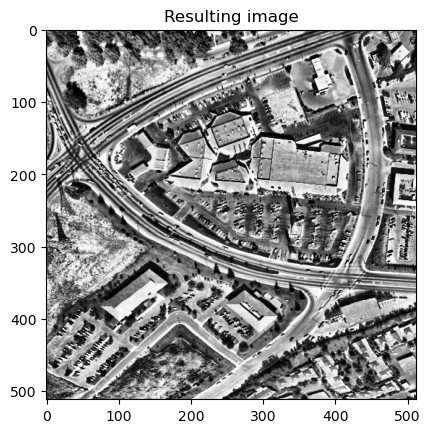

In [42]:
# Example - Aerial
image_aerial=plt.imread("C:\\Users\\abdul\\Desktop\\DataCamp\\Image Processing\\chapter 2\\image_aerial.tiff")

# Import the required module
from skimage import exposure

# Use histogram equalization to improve the contrast
image_eq =  exposure.equalize_adapthist(image_aerial, clip_limit=0.3)

# Show the original and resulting image
show_image(image_aerial, 'Original')
show_image(image_eq, 'Resulting image')

### 2.3 Transformations
Sometimes we might need to transform images by rotating or resizing them.
- Preparing images for classification Machine Learning model
- Optimaization and compression of image
- Save images wih same proportion

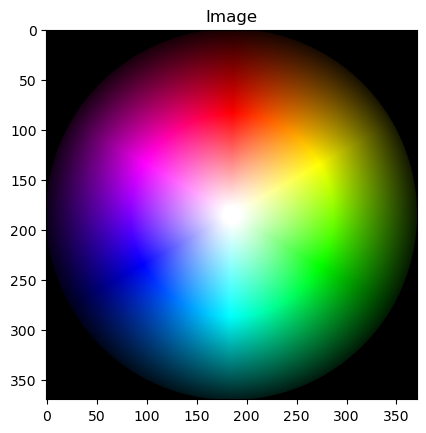

In [43]:
colorwheel=data.colorwheel()
show_image(colorwheel)

### 2.3.1 Rotating-clockwise or anticlockwise

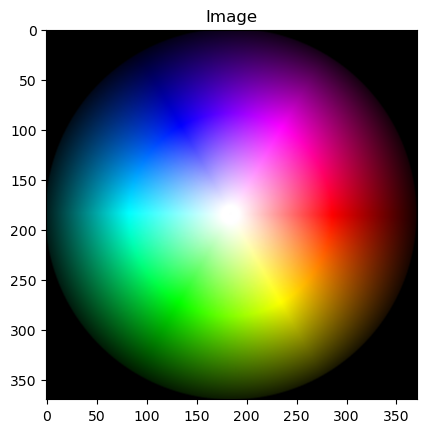

In [44]:
# Rotating clockwise
from skimage.transform import rotate

# Rotate the image 90 degree colockwisse
image_rotate=rotate(colorwheel, -90)
show_image(image_rotate)

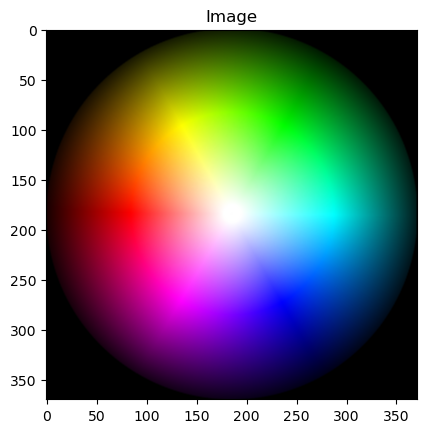

In [45]:
# Rotating anticlockwise
from skimage.transform import rotate

# Rotate the image 90 degree colockwisse
image_rotate=rotate(colorwheel, 90)

show_image(image_rotate)

### 2.3.2 Rescaling

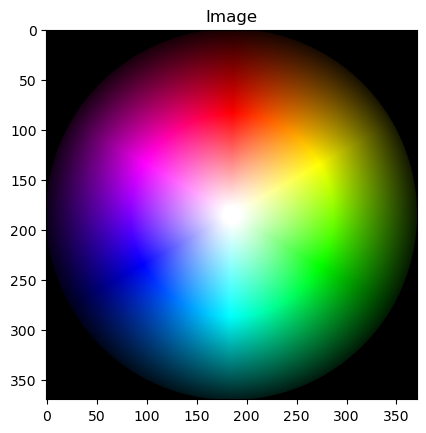

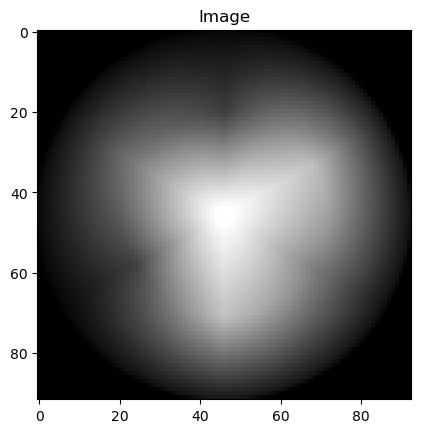

In [46]:
# Downgrading
from skimage.transform import rescale

# Rescale the image to be 4 time smaller
colorwheel_rescaled=rescale(colorwheel, 0.25, anti_aliasing=True)

show_image(colorwheel)
show_image(colorwheel_rescaled)

In [47]:
colorwheel.size, colorwheel_rescaled.size

(411810, 8556)

### 2.3.3 Resizing

(411810, 600000)

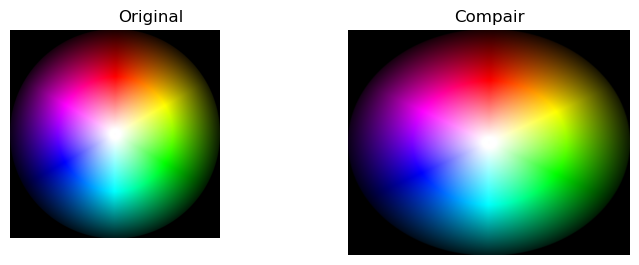

In [48]:
from skimage.transform import resize

# Height and width to resize
height=400
width=500

# Resize image
colorwheel_resized=resize(colorwheel, (height, width), anti_aliasing=True)

# show the original and resulting images
plot_comparison(colorwheel, colorwheel_resized, "Compair")
colorwheel.size, colorwheel_resized.size

(411810, 25668)

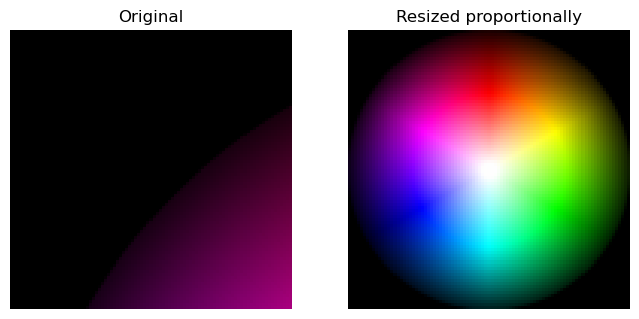

In [49]:
# Resizing proportionally

from skimage.transform import resize

# Set proportional height so its 4 times its size
height=colorwheel.shape[0]/4
width=colorwheel.shape[1]/4

# Resize image
colorwheel_resized=resize(colorwheel, (height, width), anti_aliasing=True)

# show the original and resulting images
plot_comparison(colorwheel, colorwheel_resized, "Resized proportionally")
colorwheel.size, colorwheel_resized.size

### 2.4 Morphology
Morphology is to spot objects in an image by its characteristics, like the shape.

Basic morphological operations are dilation and erosion.
- Dilation adds pixels to the boundaries of objects in an image
- Erosion removes pixels on object boundaries

The number of pixels added or removed from the objects in an image depends on the size and shape of a structuring element used to process the image.

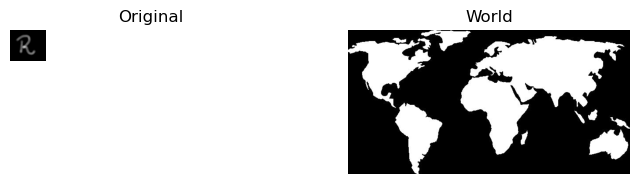

In [50]:
r5=plt.imread("C:\\Users\\abdul\\Desktop\\DataCamp\\Image Processing\\chapter 2\\r5.png")
world=plt.imread("C:\\Users\\abdul\\Desktop\\DataCamp\\Image Processing\\chapter 2\\world_image_binary.jpg")
plot_comparison(r5, world, "World")

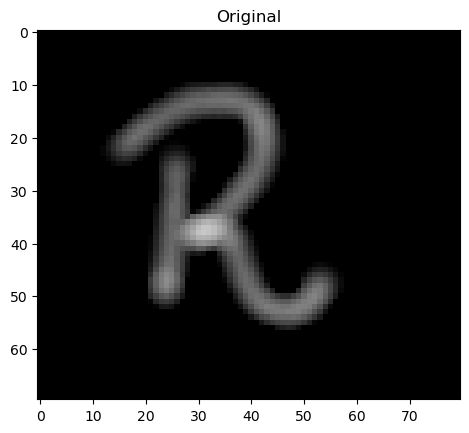

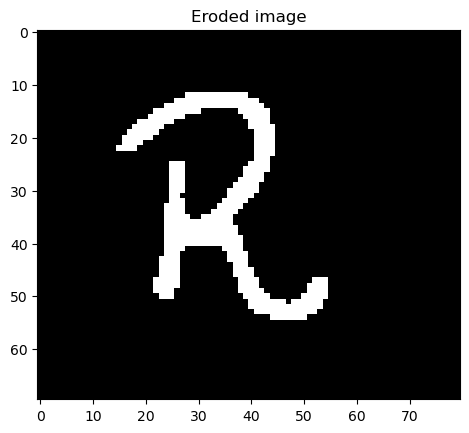

In [51]:
# Binary Erosion

from skimage import color, filters, morphology

# Convert RGB to grayscale
gray_r5 = color.rgb2gray(r5)  # Now shape is (70, 80), values in [0, 1]

# Apply Otsu's threshold
threshold_value = filters.threshold_otsu(gray_r5)
binary_r5 = gray_r5 > threshold_value  # Binary image (True/False)

# Perform erosion
eroded_image = morphology.binary_erosion(binary_r5)

# See results
show_image(r5, 'Original')
show_image(eroded_image, 'Eroded image')

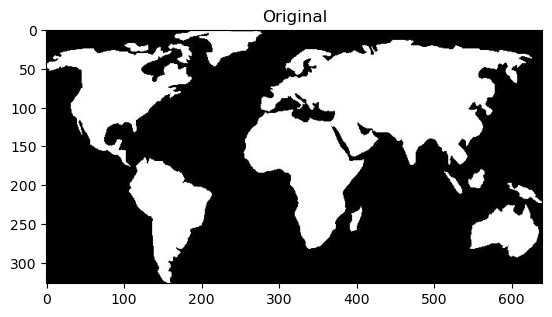

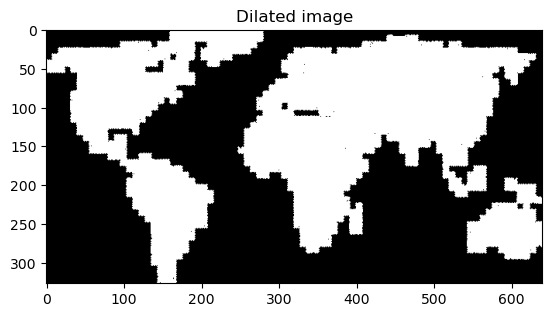

In [52]:
# Binary Dilation

from skimage import morphology

# Obtain the dilated image 
dilated_image = morphology.binary_dilation(world)

# See results
show_image(world, 'Original')
show_image(dilated_image, 'Dilated image')